In [1]:
# mount the drive

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Course-end Project 1
**Topic Analysis of Review Data**

### Description

Help a leading mobile brand understand the voice of the customer by analyzing the reviews of their product on Amazon and the topics that customers are talking about. You will perform topic modeling on specific parts of speech. You’ll finally interpret the emerging topics.

<br/>

### Problem Statement:

A popular mobile phone brand, Lenovo has launched their budget smartphone in the Indian market. The client wants to understand the VOC (voice of the customer) on the product. This will be useful to not just evaluate the current product, but to also get some direction for developing the product pipeline. The client is particularly interested in the different aspects that customers care about. Product reviews by customers on a leading e-commerce site should provide a good view.

<br/>

#### Domain:
Amazon reviews for a leading phone brand

<br/>

#### Analysis to be done:
POS tagging, topic modeling using LDA, and topic interpretation

**Content:**

Dataset: ‘K8 Reviews v0.2.csv’

**Columns:**

1. Sentiment: The sentiment against the review (4,5 star reviews are positive, 1,2 are negative)

2. Reviews: The main text of the review

<br/>

#### Steps to perform:

Discover the topics in the reviews and present it to business in a consumable format. Employ techniques in syntactic processing and topic modeling.

Perform specific cleanup, POS tagging, and restricting to relevant POS tags, then, perform topic modeling using LDA. Finally, give business-friendly names to the topics and make a table for business.

<br/>

### Tasks:

- Read the .csv file using Pandas. Take a look at the top few records.

- Normalize casings for the review text and extract the text into a list for easier manipulation.

- Tokenize the reviews using NLTKs word_tokenize function.

- Perform parts-of-speech tagging on each sentence using the NLTK POS tagger.

- For the topic model, we should  want to include only nouns.

    - Find out all the POS tags that correspond to nouns.

    - Limit the data to only terms with these tags.

- Lemmatize.

    - Different forms of the terms need to be treated as one.

    - No need to provide POS tag to lemmatizer for now.

- Remove stopwords and punctuation (if there are any).

- Create a topic model using LDA on the cleaned-up data with 12 topics.

    - Print out the top terms for each topic.

    - What is the coherence of the model with the c_v metric?

- Analyze the topics through the business lens.

    - Determine which of the topics can be combined.

- Create a topic model using LDA with what you think is the optimal number of topics

    - What is the coherence of the model?

- The business should be able to interpret the topics.

    - Name each of the identified topics.

    - Create a table with the topic name and the top 10 terms in each to present to the business.



### Install packages

In [2]:
# Install packages
!pip install nltk
!pip install spacy
!pip install re
!pip install string
!python -m spacy download en_core_web_sm
!pip install svgling

ERROR: Could not find a version that satisfies the requirement re (from versions: none)
ERROR: No matching distribution found for re
ERROR: Could not find a version that satisfies the requirement string (from versions: none)
ERROR: No matching distribution found for string
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 65.8 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.1/67.1 kB 2.9 MB/s eta 0:00:00


In [3]:
# Install pyLDAvis
!pip install pyLDAvis

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 29.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.4/345.4 kB 24.8 MB/s eta 0:00:00
  Attempting uninstall: pandas
    Found existing installation: pandas 1.5.3
    Uninstalling pandas-1.5.3:
      Successfully uninstalled pandas-1.5.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 0.22.0 requires pandas<2.1.4,>=1.5.0, but you have pandas 2.2.1 which is incompatible.
google-colab 1.0.0 requires pandas==1.5.3, but you have pandas 2.2.1 which is incompatible.


### Import necessary libraries


In [4]:
import re
import numpy as np
import pandas as pd
from pprint import pprint

# NLTK
import nltk

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# spacy for lemmatization
import spacy

# Import punctuation characters from the string module
from string import punctuation

# Plotting tools
import pyLDAvis
import pyLDAvis.gensim
import matplotlib.pyplot as plt
%matplotlib inline

# Enable logging for gensim - optional
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)

In [5]:
# Download

nltk.download('punkt')        # Downloads the Punkt sentence tokenizer model. (for tokenization)
nltk.download('omw-1.4')      # Downloads the Open Multilingual WordNet for word relations. (for lemmatization)
nltk.download('averaged_perceptron_tagger')  # Downloads the Averaged Perceptron model for part-of-speech tagging.
nltk.download('words')         # Downloads a small English corpus for basic testing.  (dictionary of words)
nltk.download('maxent_ne_chunker')  # Downloads the Maximum Entropy model for named entity recognition.
nltk.download('stopwords')     # Downloads a list of common English stop words.
nltk.download('wordnet')       # Downloads the WordNet corpus for word meanings and relationships.

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Unzipping corpora/words.zip.
[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping chunkers/maxent_ne_chunker.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [6]:
# Import the WordNet corpus and stopwords from the NLTK corpus
from nltk.corpus import wordnet, stopwords

## Task:

### 1. Read the .csv file using Pandas. Take a look at the top few records.

In [7]:
# Load data file
df = pd.read_csv("/content/drive/MyDrive/AI/NLP/My Notes/project/Topic Modeling/K8 Reviews v0.2.csv")

In [8]:
# See top few records
df.head()

,sentiment,review
0,1,Good but need updates and improvements
1,0,"Worst mobile i have bought ever, Battery is dr..."
2,1,when I will get my 10% cash back.... its alrea...
3,1,Good
4,0,The worst phone everThey have changed the last...


In [9]:
# Shape
df.shape

(14675, 2)

### 2. Normalize casings for the review text and extract the text into a list for easier manipulation.

In [10]:
# Convert to list
data = df.review.values.tolist()
data[:3]

['Good but need updates and improvements',
 "Worst mobile i have bought ever, Battery is draining like hell, backup is only 6 to 7 hours with internet uses, even if I put mobile idle its getting discharged.This is biggest lie from Amazon & Lenove which is not at all expected, they are making full by saying that battery is 4000MAH & booster charger is fake, it takes at least 4 to 5 hours to be fully charged.Don't know how Lenovo will survive by making full of us.Please don;t go for this else you will regret like me.",
 'when I will get my 10% cash back.... its already 15 January..']

In [11]:
# Normalize casings (lower case)
data = [[txt.lower()] for txt in data]
data[0:3]

[['good but need updates and improvements'],
 ["worst mobile i have bought ever, battery is draining like hell, backup is only 6 to 7 hours with internet uses, even if i put mobile idle its getting discharged.this is biggest lie from amazon & lenove which is not at all expected, they are making full by saying that battery is 4000mah & booster charger is fake, it takes at least 4 to 5 hours to be fully charged.don't know how lenovo will survive by making full of us.please don;t go for this else you will regret like me."],
 ['when i will get my 10% cash back.... its already 15 january..']]

### 3. Tokenize the reviews using NLTKs word_tokenize function.

In [12]:
# Word Tokenization

word_tokens =  [nltk.word_tokenize(" ".join(li)) for li in data]
print(word_tokens)

[['good', 'but', 'need', 'updates', 'and', 'improvements'], ['worst', 'mobile', 'i', 'have', 'bought', 'ever', ',', 'battery', 'is', 'draining', 'like', 'hell', ',', 'backup', 'is', 'only', '6', 'to', '7', 'hours', 'with', 'internet', 'uses', ',', 'even', 'if', 'i', 'put', 'mobile', 'idle', 'its', 'getting', 'discharged.this', 'is', 'biggest', 'lie', 'from', 'amazon', '&', 'lenove', 'which', 'is', 'not', 'at', 'all', 'expected', ',', 'they', 'are', 'making', 'full', 'by', 'saying', 'that', 'battery', 'is', '4000mah', '&', 'booster', 'charger', 'is', 'fake', ',', 'it', 'takes', 'at', 'least', '4', 'to', '5', 'hours', 'to', 'be', 'fully', 'charged.do', "n't", 'know', 'how', 'lenovo', 'will', 'survive', 'by', 'making', 'full', 'of', 'us.please', 'don', ';', 't', 'go', 'for', 'this', 'else', 'you', 'will', 'regret', 'like', 'me', '.'], ['when', 'i', 'will', 'get', 'my', '10', '%', 'cash', 'back', '....', 'its', 'already', '15', 'january', '..'], ['good'], ['the', 'worst', 'phone', 'everthe

In [13]:
# Document wise tokens
len(word_tokens)

14675

In [14]:
# Total tokens


# Create an empty list to store all items
flat_tokens = []

# Iterate through the nested list and append each item to the flat list
for inner_list in word_tokens:
  for token in inner_list:
    flat_tokens.append(token)

# Print the flattened list
print(flat_tokens)

# total word tokens
print(len(flat_tokens))

['good', 'but', 'need', 'updates', 'and', 'improvements', 'worst', 'mobile', 'i', 'have', 'bought', 'ever', ',', 'battery', 'is', 'draining', 'like', 'hell', ',', 'backup', 'is', 'only', '6', 'to', '7', 'hours', 'with', 'internet', 'uses', ',', 'even', 'if', 'i', 'put', 'mobile', 'idle', 'its', 'getting', 'discharged.this', 'is', 'biggest', 'lie', 'from', 'amazon', '&', 'lenove', 'which', 'is', 'not', 'at', 'all', 'expected', ',', 'they', 'are', 'making', 'full', 'by', 'saying', 'that', 'battery', 'is', '4000mah', '&', 'booster', 'charger', 'is', 'fake', ',', 'it', 'takes', 'at', 'least', '4', 'to', '5', 'hours', 'to', 'be', 'fully', 'charged.do', "n't", 'know', 'how', 'lenovo', 'will', 'survive', 'by', 'making', 'full', 'of', 'us.please', 'don', ';', 't', 'go', 'for', 'this', 'else', 'you', 'will', 'regret', 'like', 'me', '.', 'when', 'i', 'will', 'get', 'my', '10', '%', 'cash', 'back', '....', 'its', 'already', '15', 'january', '..', 'good', 'the', 'worst', 'phone', 'everthey', 'have

#### Cleaning noises
- Numbers
- Emoticons
- Special characters
- Blank spaces

In [15]:
# Function to clean text

def cleaned_data(data):

    # Join text
    join_txt = [' '.join(tkn) for tkn in data]

    # Initialization
    cln_txt=join_txt

    # Remove numbers
    # cln_txt = [re.sub(r"\d",'', tkn) for tkn in cln_txt]

    # Remove Emoticons
    # Pattern of emoji
    emoji_pattern = re.compile("["
            u"\U0001F600-\U0001F64F"  # emoticons
            u"\U0001F300-\U0001F5FF"  # symbols & pictographs
            u"\U0001F680-\U0001F6FF"  # transport & map symbols
            u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                            "]+", flags=re.UNICODE)

    # Clean emoticons
    cln_txt = [emoji_pattern.sub(r' ', tkn) for tkn in cln_txt]

    # Remove Special Characters
    # pattern
    pat = "[!\"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~]"
    cln_txt = [re.sub(pat, '', tkn) for tkn in cln_txt]

    # Remove new line characters and white space
    cln_txt = [re.sub('\s+$', '', tkn) for tkn in cln_txt]

    # Final cleaned tokens
    clean_tokens = [tkn.split() for tkn in cln_txt]

    return clean_tokens

# Call the function to clean word_tokens
cleaned_tokens = cleaned_data(word_tokens)

print(cleaned_tokens)

[['good', 'but', 'need', 'updates', 'and', 'improvements'], ['worst', 'mobile', 'i', 'have', 'bought', 'ever', 'battery', 'is', 'draining', 'like', 'hell', 'backup', 'is', 'only', '6', 'to', '7', 'hours', 'with', 'internet', 'uses', 'even', 'if', 'i', 'put', 'mobile', 'idle', 'its', 'getting', 'dischargedthis', 'is', 'biggest', 'lie', 'from', 'amazon', 'lenove', 'which', 'is', 'not', 'at', 'all', 'expected', 'they', 'are', 'making', 'full', 'by', 'saying', 'that', 'battery', 'is', '4000mah', 'booster', 'charger', 'is', 'fake', 'it', 'takes', 'at', 'least', '4', 'to', '5', 'hours', 'to', 'be', 'fully', 'chargeddo', 'nt', 'know', 'how', 'lenovo', 'will', 'survive', 'by', 'making', 'full', 'of', 'usplease', 'don', 't', 'go', 'for', 'this', 'else', 'you', 'will', 'regret', 'like', 'me'], ['when', 'i', 'will', 'get', 'my', '10', 'cash', 'back', 'its', 'already', '15', 'january'], ['good'], ['the', 'worst', 'phone', 'everthey', 'have', 'changed', 'the', 'last', 'phone', 'but', 'the', 'proble

### 4. Perform parts-of-speech tagging on each sentence using the NLTK POS tagger

In [16]:
# With NLTK
tagged_tokens =  [nltk.pos_tag(tkn) for tkn in cleaned_tokens]
tagged_tokens

[[('good', 'JJ'),
  ('but', 'CC'),
  ('need', 'VBP'),
  ('updates', 'NNS'),
  ('and', 'CC'),
  ('improvements', 'NNS')],
 [('worst', 'JJS'),
  ('mobile', 'NN'),
  ('i', 'NN'),
  ('have', 'VBP'),
  ('bought', 'VBN'),
  ('ever', 'RB'),
  ('battery', 'NN'),
  ('is', 'VBZ'),
  ('draining', 'VBG'),
  ('like', 'IN'),
  ('hell', 'NN'),
  ('backup', 'NN'),
  ('is', 'VBZ'),
  ('only', 'RB'),
  ('6', 'CD'),
  ('to', 'TO'),
  ('7', 'CD'),
  ('hours', 'NNS'),
  ('with', 'IN'),
  ('internet', 'NN'),
  ('uses', 'NNS'),
  ('even', 'RB'),
  ('if', 'IN'),
  ('i', 'JJ'),
  ('put', 'VBP'),
  ('mobile', 'JJ'),
  ('idle', 'NN'),
  ('its', 'PRP$'),
  ('getting', 'VBG'),
  ('dischargedthis', 'NN'),
  ('is', 'VBZ'),
  ('biggest', 'JJS'),
  ('lie', 'NN'),
  ('from', 'IN'),
  ('amazon', 'NN'),
  ('lenove', 'NN'),
  ('which', 'WDT'),
  ('is', 'VBZ'),
  ('not', 'RB'),
  ('at', 'IN'),
  ('all', 'DT'),
  ('expected', 'VBN'),
  ('they', 'PRP'),
  ('are', 'VBP'),
  ('making', 'VBG'),
  ('full', 'JJ'),
  ('by', 'IN'),

### 5. For the topic model, we should want to include only nouns.
- Find out all the POS tags that correspond to nouns.
- Limit the data to only terms with these tags.

* Find out all the POS tags that correspond to nouns.

In [17]:
# list to store noun tags
noun_tags = []

# Loop through the POS tags
for doc in tagged_tokens:
    for token, tag in doc:
        # Check if the tag starts with 'NN' (noun)
        if tag.startswith('NN'):
            noun_tags.append(tag)

# set operation to find unique noun tags
noun_tags = set(noun_tags)

# Print the list of noun tags
print(noun_tags)

{'NNS', 'NN', 'NNP'}


* Limit the data to only terms with these tags.

In [18]:
# Limit data using list comprehension
filtered_tag_data = [[word for word, tag in doc if tag in noun_tags] for doc in tagged_tokens]
print(filtered_tag_data)

[['updates', 'improvements'], ['mobile', 'i', 'battery', 'hell', 'backup', 'hours', 'internet', 'uses', 'idle', 'dischargedthis', 'lie', 'amazon', 'lenove', 'battery', 'booster', 'charger', 'hours', 'nt', 'don', 't'], ['i', 'cash'], [], ['phone', 'everthey', 'phone', 'problem', 'amazon', 'phone', 'amazon'], ['m', 'm', 'camerawaste', 'money'], ['phone', 'reason', 'k8'], ['battery', 'level'], ['problems', 'phone', 'hanging', 'problems', 'note', 'station', 'ahmedabad', 'years', 'phone', 'lenovo'], ['lot', 'glitches', 'thing', 'options'], ['wrost'], ['phone', 'charger', 'damage', 'months'], ['purchase', 'item', 'battery', 'life'], ['i', 'battery', 'problem', 'motherboard', 'problem', 'months', 'mobile', 'life'], ['phone', 'slim', 'battry', 'backup', 'screen'], ['headset'], ['time', 'i'], ['product', 'prize', 'range', 'specification', 'comparison', 'range', 'i', 'phone', 'seal', 'i', 'credit', 'card', 'i', 'deal', 'amazon'], ['battery', 'solutions', 'battery', 'life'], ['smartphone'], [], [

### 6. Lemmatize.
* Different forms of the terms need to be treated as one.
* No need to provide POS tag to lemmatizer for now.

In [19]:
# Instantiate
lemmatizer = nltk.stem.WordNetLemmatizer()

# Lemmatization
lemmatized_data = [[lemmatizer.lemmatize(word) for word in doc] for doc in  filtered_tag_data]
print(lemmatized_data)

[['update', 'improvement'], ['mobile', 'i', 'battery', 'hell', 'backup', 'hour', 'internet', 'us', 'idle', 'dischargedthis', 'lie', 'amazon', 'lenove', 'battery', 'booster', 'charger', 'hour', 'nt', 'don', 't'], ['i', 'cash'], [], ['phone', 'everthey', 'phone', 'problem', 'amazon', 'phone', 'amazon'], ['m', 'm', 'camerawaste', 'money'], ['phone', 'reason', 'k8'], ['battery', 'level'], ['problem', 'phone', 'hanging', 'problem', 'note', 'station', 'ahmedabad', 'year', 'phone', 'lenovo'], ['lot', 'glitch', 'thing', 'option'], ['wrost'], ['phone', 'charger', 'damage', 'month'], ['purchase', 'item', 'battery', 'life'], ['i', 'battery', 'problem', 'motherboard', 'problem', 'month', 'mobile', 'life'], ['phone', 'slim', 'battry', 'backup', 'screen'], ['headset'], ['time', 'i'], ['product', 'prize', 'range', 'specification', 'comparison', 'range', 'i', 'phone', 'seal', 'i', 'credit', 'card', 'i', 'deal', 'amazon'], ['battery', 'solution', 'battery', 'life'], ['smartphone'], [], ['galery', 'prob

### 7. Remove stopwords and punctuation (if there are any).

In [20]:
# get the english stopwords

stop_words_eng = stopwords.words('english')
print(stop_words_eng)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [21]:
# clean the stopwords

no_stop_data = [[w for w in tkn if w not in stop_words_eng] for tkn in lemmatized_data]
print(no_stop_data)

[['update', 'improvement'], ['mobile', 'battery', 'hell', 'backup', 'hour', 'internet', 'us', 'idle', 'dischargedthis', 'lie', 'amazon', 'lenove', 'battery', 'booster', 'charger', 'hour', 'nt'], ['cash'], [], ['phone', 'everthey', 'phone', 'problem', 'amazon', 'phone', 'amazon'], ['camerawaste', 'money'], ['phone', 'reason', 'k8'], ['battery', 'level'], ['problem', 'phone', 'hanging', 'problem', 'note', 'station', 'ahmedabad', 'year', 'phone', 'lenovo'], ['lot', 'glitch', 'thing', 'option'], ['wrost'], ['phone', 'charger', 'damage', 'month'], ['purchase', 'item', 'battery', 'life'], ['battery', 'problem', 'motherboard', 'problem', 'month', 'mobile', 'life'], ['phone', 'slim', 'battry', 'backup', 'screen'], ['headset'], ['time'], ['product', 'prize', 'range', 'specification', 'comparison', 'range', 'phone', 'seal', 'credit', 'card', 'deal', 'amazon'], ['battery', 'solution', 'battery', 'life'], ['smartphone'], [], ['galery', 'problem', 'speaker', 'phone'], ['camera', 'speedexcellent', '

In [22]:
# Remove punctuation if there any
# Join text
join_txt = [' '.join(tkn) for tkn in no_stop_data]

no_punc_data = [re.sub('[%s]' % re.escape(punctuation), '', tkn) for tkn in join_txt]

# Final cleaned tokens
final_cleaned_tokens = [tkn.split() for tkn in no_punc_data]
print(final_cleaned_tokens)

[['update', 'improvement'], ['mobile', 'battery', 'hell', 'backup', 'hour', 'internet', 'us', 'idle', 'dischargedthis', 'lie', 'amazon', 'lenove', 'battery', 'booster', 'charger', 'hour', 'nt'], ['cash'], [], ['phone', 'everthey', 'phone', 'problem', 'amazon', 'phone', 'amazon'], ['camerawaste', 'money'], ['phone', 'reason', 'k8'], ['battery', 'level'], ['problem', 'phone', 'hanging', 'problem', 'note', 'station', 'ahmedabad', 'year', 'phone', 'lenovo'], ['lot', 'glitch', 'thing', 'option'], ['wrost'], ['phone', 'charger', 'damage', 'month'], ['purchase', 'item', 'battery', 'life'], ['battery', 'problem', 'motherboard', 'problem', 'month', 'mobile', 'life'], ['phone', 'slim', 'battry', 'backup', 'screen'], ['headset'], ['time'], ['product', 'prize', 'range', 'specification', 'comparison', 'range', 'phone', 'seal', 'credit', 'card', 'deal', 'amazon'], ['battery', 'solution', 'battery', 'life'], ['smartphone'], [], ['galery', 'problem', 'speaker', 'phone'], ['camera', 'speedexcellent', '

In [23]:
# len of clean data
len(final_cleaned_tokens)

14675

### 8. Create a topic model using LDA on the cleaned-up data with 12 topics.
- Print out the top terms for each topic.
- What is the coherence of the model with the c_v metric?

In [24]:
# Create the Dictionary and Corpus needed for Topic Modeling

# Create Dictionary
id2word = corpora.Dictionary(final_cleaned_tokens)

# Create Corpus
texts = final_cleaned_tokens

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
print(corpus[:1])

[[(0, 1), (1, 1)]]


In [25]:
# See first word of dictionary
id2word[0]

'improvement'

In [26]:
# Human readable format of corpus (term-frequency)
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]]

[[('improvement', 1), ('update', 1)]]

In [27]:
# Build LDA model with 12 topics
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=12,
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)

In [28]:
lda_model.print_topics()[:2]

[(0,
  '0.383*"problem" + 0.140*"heating" + 0.066*"everything" + 0.036*"touch" + 0.032*"button" + 0.031*"image" + 0.019*"auto" + 0.018*"rest" + 0.015*"cell" + 0.011*"choice"'),
 (1,
  '0.049*"sim" + 0.048*"delivery" + 0.043*"lot" + 0.036*"handset" + 0.036*"work" + 0.033*"support" + 0.031*"superb" + 0.030*"glass" + 0.028*"card" + 0.028*"star"')]

- Print out the top terms for each topic.

In [29]:
# Define the number of topics and desired number of top terms per topic
num_topics = lda_model.num_topics
num_words_per_topic = 1

# Print the top terms for each topic
print("Top", num_words_per_topic, "words for each topic:")
top_terms = lda_model.print_topics(num_topics=num_topics, num_words=num_words_per_topic)
top_terms

Top 1 words for each topic:


[(0, '0.383*"problem"'),
 (1, '0.049*"sim"'),
 (2, '0.167*"day"'),
 (3, '0.320*"camera"'),
 (4, '0.334*"battery"'),
 (5, '0.526*"product"'),
 (6, '0.183*"issue"'),
 (7, '0.000*"improvement"'),
 (8, '0.086*"hour"'),
 (9, '0.074*"screen"'),
 (10, '0.290*"note"'),
 (11, '0.402*"phone"')]

In [30]:
# Make data frame for better visualization

# split perc*term
split_term = [(topic, term.split('*')) for (topic, term) in top_terms]

# Create a list
topic_words = []

# Extract topic number and word (remove quotes)
for topic_id, word_list in split_term:
  perc_contribution = word_list[0]
  word = word_list[1].strip('"')  # Remove quotes from the word
  topic_words.append([topic_id, word, perc_contribution])


# Create DataFrame
top_term_df = pd.DataFrame(data=topic_words, columns=["Topic", "Top_Term", "Perc_Contribution"])
top_term_df

,Topic,Top_Term,Perc_Contribution
0,0,problem,0.383
1,1,sim,0.049
2,2,day,0.167
3,3,camera,0.320
4,4,battery,0.334
5,5,product,0.526
6,6,issue,0.183
7,7,improvement,0.000
8,8,hour,0.086
9,9,screen,0.074


* What is the coherence of the model with the c_v metric?

In [31]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=final_cleaned_tokens, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.4541953659913283


### 9. Analyze the topics through the business lens.
* Determine which of the topics can be combined.

In [32]:
# Define the number of topics and desired number of top terms per topic
num_topics = lda_model.num_topics
num_words_per_topic = 10

# Print the top terms for each topic
print("Top", num_words_per_topic, "words for each topic:")
top_terms = lda_model.print_topics(num_topics=num_topics, num_words=num_words_per_topic)
top_terms

Top 10 words for each topic:


[(0,
  '0.383*"problem" + 0.140*"heating" + 0.066*"everything" + 0.036*"touch" + 0.032*"button" + 0.031*"image" + 0.019*"auto" + 0.018*"rest" + 0.015*"cell" + 0.011*"choice"'),
 (1,
  '0.049*"sim" + 0.048*"delivery" + 0.043*"lot" + 0.036*"handset" + 0.036*"work" + 0.033*"support" + 0.031*"superb" + 0.030*"glass" + 0.028*"card" + 0.028*"star"'),
 (2,
  '0.167*"day" + 0.115*"k8" + 0.045*"please" + 0.042*"h" + 0.041*"hai" + 0.032*"game" + 0.022*"refund" + 0.021*"power" + 0.019*"worth" + 0.014*"sale"'),
 (3,
  '0.320*"camera" + 0.127*"quality" + 0.080*"performance" + 0.058*"money" + 0.057*"network" + 0.026*"speed" + 0.020*"value" + 0.019*"experience" + 0.017*"photo" + 0.016*"buy"'),
 (4,
  '0.334*"battery" + 0.164*"mobile" + 0.057*"backup" + 0.042*"range" + 0.029*"video" + 0.021*"mark" + 0.019*"clarity" + 0.018*"key" + 0.015*"smartphone" + 0.014*"expectation"'),
 (5,
  '0.526*"product" + 0.036*"model" + 0.034*"min" + 0.033*"thanks" + 0.023*"earphone" + 0.019*"ok" + 0.018*"guy" + 0.016*"n" 

In [33]:
# Make data frame for better visualization

# split perc*term
split_term = [(topic, term.split('+')) for (topic, term) in top_terms]


# Create a list
topic_words = []

# Extract topic number and word (remove quotes)
for topic_id, word_list in split_term:

    term = []
    for t in word_list:
        term.append(t.strip("'"))

    topic_words.append([topic_id] + term)

# Create DataFrame
top_term_df = pd.DataFrame(data=topic_words, columns=["Topic"] + ["Term_"+str(i) for i in range(10)])
top_term_df

,Topic,Term_0,Term_1,Term_2,Term_3,Term_4,Term_5,Term_6,Term_7,Term_8,Term_9
0,0,"0.383*""problem""","0.140*""heating""","0.066*""everything""","0.036*""touch""","0.032*""button""","0.031*""image""","0.019*""auto""","0.018*""rest""","0.015*""cell""","0.011*""choice"""
1,1,"0.049*""sim""","0.048*""delivery""","0.043*""lot""","0.036*""handset""","0.036*""work""","0.033*""support""","0.031*""superb""","0.030*""glass""","0.028*""card""","0.028*""star"""
2,2,"0.167*""day""","0.115*""k8""","0.045*""please""","0.042*""h""","0.041*""hai""","0.032*""game""","0.022*""refund""","0.021*""power""","0.019*""worth""","0.014*""sale"""
3,3,"0.320*""camera""","0.127*""quality""","0.080*""performance""","0.058*""money""","0.057*""network""","0.026*""speed""","0.020*""value""","0.019*""experience""","0.017*""photo""","0.016*""buy"""
4,4,"0.334*""battery""","0.164*""mobile""","0.057*""backup""","0.042*""range""","0.029*""video""","0.021*""mark""","0.019*""clarity""","0.018*""key""","0.015*""smartphone""","0.014*""expectation"""
5,5,"0.526*""product""","0.036*""model""","0.034*""min""","0.033*""thanks""","0.023*""earphone""","0.019*""ok""","0.018*""guy""","0.016*""n""","0.014*""suggestion""","0.011*""hope"""
6,6,"0.183*""issue""","0.128*""time""","0.065*""service""","0.063*""amazon""","0.062*""device""","0.031*""customer""","0.027*""drain""","0.023*""system""","0.019*""center""","0.018*""need"""
7,7,"0.000*""expect""","0.000*""deadtaken""","0.000*""irony""","0.000*""hoursif""","0.000*""kindbut""","0.000*""changing""","0.000*""24hours""","0.000*""afterall""","0.000*""indorelenevo""","0.000*""plaza"""
8,8,"0.086*""hour""","0.081*""charger""","0.081*""mode""","0.064*""charge""","0.063*""waste""","0.043*""turbo""","0.040*""return""","0.040*""hr""","0.039*""depth""","0.038*""data"""
9,9,"0.074*""screen""","0.053*""heat""","0.050*""display""","0.049*""processor""","0.046*""speaker""","0.042*""option""","0.038*""use""","0.037*""music""","0.027*""thing""","0.026*""usage"""


In [34]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
11     0.405014 -0.195354       1        1  23.556574
3      0.132724  0.394352       2        1  13.369908
4      0.061174  0.071401       3        1  11.187017
6     -0.000751  0.000787       4        1   9.691034
9     -0.014860 -0.009802       5        1   9.465162
1     -0.052127 -0.028902       6        1   7.273727
2     -0.069503 -0.035448       7        1   6.252395
8     -0.073922 -0.035471       8        1   5.766422
5     -0.086868 -0.039050       9        1   4.696511
10    -0.097399 -0.042139      10        1   4.492649
0     -0.090980 -0.040096      11        1   4.194960
7     -0.112501 -0.040277      12        1   0.053643, topic_info=       Term         Freq        Total Category  logprob  loglift
19    phone  8114.000000  8114.000000  Default  30.0000  30.0000
61   camera  3668.000000  3668.000000  Default  29.0000  29.0000
4   battery  3208.000000  3208.000000  Default  28.0000  28.0000
53  product  2118.000000  2118.000000  Default  27.0000  27.0000
20  problem  1379.000000  1379.000000  Default  26.0000  26.0000
..      ...          ...          ...      ...      ...      ...
24   reason     0.005427    31.879316  Topic12  -9.0448  -1.1478
25    level     0.005427    37.851024  Topic12  -9.0448  -1.3195
27  hanging     0.005427    13.569453  Topic12  -9.0448  -0.2936
28   lenovo     0.005427   855.477295  Topic12  -9.0448  -4.4375
29     note     0.005427  1117.504586  Topic12  -9.0448  -4.7047

[422 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
520       8  0.958436   airtel
2         4  0.999017   amazon
199      10  0.992558  android
215       9  0.943875   anyone
640       1  0.996962      app
...     ...       ...      ...
131       6  0.998147     work
462       7  0.987105    worth
36        9  0.976984    wrost
338       7  0.980030       ye
410       2  0.977639     zoom

[325 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[12, 4, 5, 7, 10, 2, 3, 9, 6, 11, 1, 8])

#### Comment:
- From dataframe "top_term_df" by analyzing all topic and terms, we can conclude that each topic does not cotain proper terms
- As an example topic 7 contains keywords (like expect, deadtaken, irony, etc) which has no contibution to that topic. It can be combined with other topics.
- Finally, we need to find out optimal topic numbers, by running several lda_model for a set of topic numbers and find out optimal topic numbers based on optimized Coherence Score.
- We can see, in the above graph maximum circles are closed to each other and small. So, from here we also can say topics numbers are not optimized.
- We do this step below

### 10. Create a topic model using LDA with what you think is the optimal number of topics
* What is the coherence of the model?

In [35]:
# This is for lda
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=num_topics,
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [36]:
# Call the compute_coherence_values function
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=final_cleaned_tokens, start=2, limit=20, step=2)

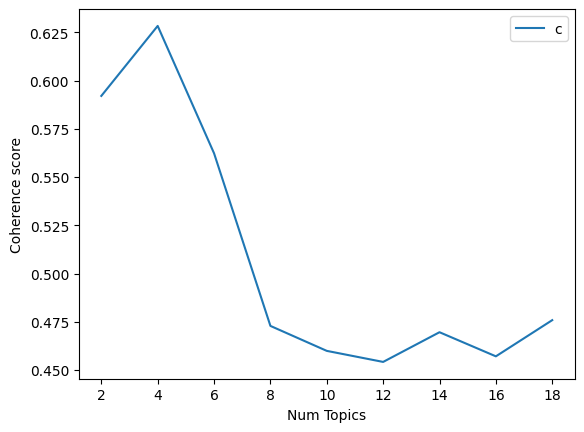

In [37]:
# Show graph
limit=20; start=2; step=2;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [38]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Coherence Value of Topics ", m, " : ", round(cv, 4))

Coherence Value of Topics  2  :  0.5921
Coherence Value of Topics  4  :  0.6284
Coherence Value of Topics  6  :  0.5623
Coherence Value of Topics  8  :  0.4729
Coherence Value of Topics  10  :  0.4599
Coherence Value of Topics  12  :  0.4542
Coherence Value of Topics  14  :  0.4696
Coherence Value of Topics  16  :  0.4571
Coherence Value of Topics  18  :  0.4759


#### Analysis:

The score increases steadily from 2 topics to 4 topics, reaching a peak of 0.6284. This suggests that with 4 topics, the model effectively identifies coherent themes within the data.

After 4 topics, the coherence score starts to decrease. This indicates that adding more topics might lead to overfitting, where the model starts capturing noise or irrelevant details instead of meaningful themes.

Therefore, based on the principle of maximizing coherence while avoiding overfitting, 4 topics seems to be the optimal choice in this case.

Also i will also do it for 5 topics. Then i will analysis which is optimal model and why it will best choice.

In [39]:
# Select the model and print the topics
lda_model_4= model_list[1]
model_topics = lda_model_4.show_topics(formatted=False)
pprint(lda_model_4.print_topics(num_words=20))

[(0,
  '0.185*"camera" + 0.074*"quality" + 0.031*"heating" + 0.028*"call" + '
  '0.028*"backup" + 0.019*"sound" + 0.015*"everything" + 0.014*"video" + '
  '0.010*"photo" + 0.009*"clarity" + 0.009*"review" + 0.009*"light" + '
  '0.008*"key" + 0.008*"min" + 0.008*"look" + 0.008*"picture" + 0.007*"need" + '
  '0.007*"hang" + 0.007*"headphone" + 0.007*"notification"'),
 (1,
  '0.222*"phone" + 0.047*"problem" + 0.035*"note" + 0.028*"price" + '
  '0.027*"feature" + 0.023*"lenovo" + 0.019*"k8" + 0.016*"screen" + '
  '0.016*"month" + 0.011*"range" + 0.011*"display" + 0.011*"processor" + '
  '0.010*"speaker" + 0.009*"option" + 0.008*"music" + 0.007*"bit" + '
  '0.007*"handset" + 0.007*"app" + 0.007*"work" + 0.006*"thing"'),
 (2,
  '0.137*"product" + 0.088*"mobile" + 0.029*"service" + 0.029*"amazon" + '
  '0.022*"software" + 0.018*"delivery" + 0.015*"please" + 0.014*"h" + '
  '0.014*"customer" + 0.014*"hai" + 0.012*"support" + 0.009*"touch" + '
  '0.009*"signal" + 0.009*"center" + 0.008*"expecta

### Analysis:
Analysis of the Text as a Topic Model
The result represents the top words for four topics identified in topic modeling process for Lenovo K8 smartphone reviews on Amazon.

<br/>

#### Here the Potential Topics:

* **Camera:** Words like "camera," "quality," "photo," "clarity," "video," and "light" suggest a topic focusing on camera performance and image quality.
* **Phone:** Words like "phone," "problem," "price," "feature," "lenovo," "k8," "screen," "processor," and "speaker" indicate a topic related to the overall phone experience, including potential issues and functionalities.
* **Service:** Words like "product," "mobile," "service," "amazon," "delivery," "customer," "support," and "refund" suggest a topic about customer service experiences, including aspects like delivery and support interactions.
* **Battery:** Words like "battery," "issue," "time," "day," "performance," "charger," "life," "charge," and "heat" point towards a topic focused on battery life, charging performance, and potential battery-related issues.

In [40]:
# Build LDA model with 5 topics
lda_model_5 = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=5,
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)



In [41]:
model_topics = lda_model_5.show_topics(formatted=False)
pprint(lda_model_5.print_topics(num_words=20))

[(0,
  '0.289*"phone" + 0.061*"problem" + 0.054*"issue" + 0.036*"price" + '
  '0.035*"feature" + 0.024*"network" + 0.022*"heating" + 0.020*"call" + '
  '0.015*"update" + 0.014*"sound" + 0.013*"life" + 0.011*"everything" + '
  '0.009*"app" + 0.007*"review" + 0.006*"key" + 0.006*"min" + 0.006*"box" + '
  '0.006*"look" + 0.006*"purchase" + 0.006*"company"'),
 (1,
  '0.063*"note" + 0.042*"lenovo" + 0.035*"k8" + 0.030*"screen" + 0.029*"month" '
  '+ 0.026*"device" + 0.023*"hour" + 0.022*"charger" + 0.020*"processor" + '
  '0.019*"speaker" + 0.017*"option" + 0.016*"sim" + 0.015*"music" + '
  '0.012*"handset" + 0.012*"work" + 0.012*"turbo" + 0.011*"hr" + '
  '0.010*"budget" + 0.010*"data" + 0.010*"dolby"'),
 (2,
  '0.168*"product" + 0.036*"service" + 0.035*"amazon" + 0.022*"delivery" + '
  '0.019*"please" + 0.018*"h" + 0.018*"customer" + 0.017*"hai" + '
  '0.015*"support" + 0.014*"usage" + 0.013*"photo" + 0.012*"replacement" + '
  '0.011*"touch" + 0.011*"signal" + 0.011*"center" + 0.010*"need

In [42]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model_5, texts=final_cleaned_tokens, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.5858435303466393


### Analysis of the 5-Topic Model
Based on the above result, we can conclude analysis below

#### **Coherence Score:**

The 5-topic model has a coherence score of 0.5858, which is lower than the 4-topic model's score of 0.6284 (mentioned earlier).

<br/>

#### **Topic Analysis:**

While I can't see the specific words associated with each topic in the 5-topic model, we can make some general observations based on the top words provided:

* **General Phone Experience:** This topic seems similar to Topic 2 in the 4-topic model, focusing on phone aspects like network, screen, processor, etc., with the addition of words like "problem" and "issue."

* **Lenovo K8 Specific:** This topic focuses on the Lenovo K8 model, including mentions of screen size, battery life, processor, and potentially user experience ("work"). This could be a more specific sub-topic within the broader "General Phone Experience" of the 4-topic model.

* **Service:** This topic remains similar to the 4-topic model, focusing on customer service interactions with Amazon.

* **Camera:** This topic appears similar to the 4-topic model, focusing on camera quality, but with additional words like "day" and "money" which could suggest user experience related to camera usage.

* **Battery:** This topic is likely similar to the 4-topic model, focusing on battery life and performance, with additional words like "mobile" and "performance" potentially broadening the scope.

### **Choosing right model:**
Considering the lower coherence score and potential overlap between topics, especially "General Phone Experience" and "Lenovo K8 Specific," opting for **the 4-topic model** (score 0.6284) seems like a better choice.

<br/>

#### **Here's why:**

* **Higher Coherence:** The 4-topic model has a slightly higher coherence score, indicating potentially more focused topics.

* **Simpler Interpretation:** With fewer topics, it might be easier to understand the underlying themes in the reviews.

* **Merging Topics:** You could potentially combine the "General Phone Experience" and "Lenovo K8 Specific" topics from the 5-topic model if they contain significant overlap, resulting in a similar thematic breakdown as the 4-topic model.

<br/>

#### **Optimal Model:**
* So, model for 4 topics is our optimal model and that is **lda_model_4**
* Coherence Value for this model is  0.6284

In [43]:
optimal_model = lda_model_4

### 11. The business should be able to interpret the topics.
* Name each of the identified topics.
* Create a table with the topic name and the top 10 terms in each to present to the business.

In [44]:
model_topics = optimal_model.show_topics(formatted=False)
pprint(optimal_model.print_topics(num_words=20))

[(0,
  '0.185*"camera" + 0.074*"quality" + 0.031*"heating" + 0.028*"call" + '
  '0.028*"backup" + 0.019*"sound" + 0.015*"everything" + 0.014*"video" + '
  '0.010*"photo" + 0.009*"clarity" + 0.009*"review" + 0.009*"light" + '
  '0.008*"key" + 0.008*"min" + 0.008*"look" + 0.008*"picture" + 0.007*"need" + '
  '0.007*"hang" + 0.007*"headphone" + 0.007*"notification"'),
 (1,
  '0.222*"phone" + 0.047*"problem" + 0.035*"note" + 0.028*"price" + '
  '0.027*"feature" + 0.023*"lenovo" + 0.019*"k8" + 0.016*"screen" + '
  '0.016*"month" + 0.011*"range" + 0.011*"display" + 0.011*"processor" + '
  '0.010*"speaker" + 0.009*"option" + 0.008*"music" + 0.007*"bit" + '
  '0.007*"handset" + 0.007*"app" + 0.007*"work" + 0.006*"thing"'),
 (2,
  '0.137*"product" + 0.088*"mobile" + 0.029*"service" + 0.029*"amazon" + '
  '0.022*"software" + 0.018*"delivery" + 0.015*"please" + 0.014*"h" + '
  '0.014*"customer" + 0.014*"hai" + 0.012*"support" + 0.009*"touch" + '
  '0.009*"signal" + 0.009*"center" + 0.008*"expecta

#### Name each of the identified topics
- Topic id 0 is Camera
- Topic id 1 is Phone
- Topic id 2 is Service
- Topic id 3 is Battery

<br/>

#### Here's why?
Each topic contains related terms like below:
* **Camera:** Words like "camera," "quality," "photo," "clarity," "video," and "light" suggest a topic focusing on camera performance and image quality.
* **Phone:** Words like "phone," "problem," "price," "feature," "lenovo," "k8," "screen," "processor," and "speaker" indicate a topic related to the overall phone experience, including potential issues and functionalities.
* **Service:** Words like "product," "mobile," "service," "amazon," "delivery," "customer," "support," and "refund" suggest a topic about customer service experiences, including aspects like delivery and support interactions.
* **Battery:** Words like "battery," "issue," "time," "day," "performance," "charger," "life," "charge," and "heat" point towards a topic focused on battery life, charging performance, and potential battery-related issues.

In [45]:
# Define the number of topics and desired number of top terms per topic
num_topics = optimal_model.num_topics
num_words_per_topic = 10

# Print the top terms for each topic
print("Top", num_words_per_topic, "words for each topic:")
top_terms = optimal_model.print_topics(num_topics=num_topics, num_words=num_words_per_topic)
top_terms

Top 10 words for each topic:


[(0,
  '0.185*"camera" + 0.074*"quality" + 0.031*"heating" + 0.028*"call" + 0.028*"backup" + 0.019*"sound" + 0.015*"everything" + 0.014*"video" + 0.010*"photo" + 0.009*"clarity"'),
 (1,
  '0.222*"phone" + 0.047*"problem" + 0.035*"note" + 0.028*"price" + 0.027*"feature" + 0.023*"lenovo" + 0.019*"k8" + 0.016*"screen" + 0.016*"month" + 0.011*"range"'),
 (2,
  '0.137*"product" + 0.088*"mobile" + 0.029*"service" + 0.029*"amazon" + 0.022*"software" + 0.018*"delivery" + 0.015*"please" + 0.014*"h" + 0.014*"customer" + 0.014*"hai"'),
 (3,
  '0.118*"battery" + 0.055*"issue" + 0.038*"time" + 0.037*"day" + 0.034*"performance" + 0.024*"money" + 0.024*"network" + 0.019*"device" + 0.017*"hour" + 0.016*"charger"')]

In [46]:
# Make data frame for better visualization

# split perc*term
split_term = [(topic, term.split('+')) for (topic, term) in top_terms]


# Create a list
topic_words = []

# Extract topic number and word (remove quotes)
for topic_id, word_list in split_term:

    term = []
    for t in word_list:
        term.append(t.split("*")[1])

    topic_words.append([topic_id] + term)

# Create DataFrame
top_term_df = pd.DataFrame(data=topic_words, columns=["Topic"] + ["Term_"+str(i) for i in range(10)])
top_term_df

,Topic,Term_0,Term_1,Term_2,Term_3,Term_4,Term_5,Term_6,Term_7,Term_8,Term_9
0,0,"""camera""","""quality""","""heating""","""call""","""backup""","""sound""","""everything""","""video""","""photo""","""clarity"""
1,1,"""phone""","""problem""","""note""","""price""","""feature""","""lenovo""","""k8""","""screen""","""month""","""range"""
2,2,"""product""","""mobile""","""service""","""amazon""","""software""","""delivery""","""please""","""h""","""customer""","""hai"""
3,3,"""battery""","""issue""","""time""","""day""","""performance""","""money""","""network""","""device""","""hour""","""charger"""


### Conclusion

This topic modeling analysis identified 4 distinct topics within the text corpus of Lenovo K8 smartphone reviews on Amazon.

The topics provide insights into various aspects of user experience:
* Topic 1 suggest a topic focusing on camera performance and image quality
* Topic 2 suggest a topic related to the overall phone experience, including potential issues and functionalities
* Topic 3 suggest a topic about customer service experiences, including aspects like delivery and support interactions.
* Topic 4 points towards a topic focused on battery life, charging performance, and potential battery-related issues.

As based on this topic modeling, I can conclude that Maximum customers are not satisfied with Lenovo K8 smartphone though the camera quality of the smart phone is good, but there is some issue with battery, charging, heating, performance.

I think, the smart phone will have to focus more on these issues for giving better customer experience.

<br/>

#### Note:
In this project, it is mentioned to cut out data by taking noun tag related words. If, it is considered other tags like adjective, adverb, verb, etc, the topic modeling could be different. The customer's sentiment could be more cleared.

<br/>
Thank You!
